In [1]:
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
import sys

sys.path.insert(1, str(Path().cwd().parent))
import common_config

In [2]:
common_config.figure_journal_basic()

In [3]:
import pertpy as pt
import scanpy as sc
import matplotlib.pyplot as plt

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [5]:
adata = pt.dt.zhang_2021()
adata

AnnData object with n_obs × n_vars = 489490 × 27085
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster'

In [6]:
# Filter to tumor samples only
adata = adata[adata.obs["Origin"] == "t", :].copy()
adata

AnnData object with n_obs × n_vars = 167244 × 27085
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster'

In [7]:
# Filter out progression samples
adata = adata[adata.obs["Group"] != "Progression", :].copy()

# Subset to partial response and stable disease and rename PR and SD
adata = adata[adata.obs["Efficacy"].isin(["PR", "SD"]), :].copy()
adata.obs["Efficacy"] = adata.obs["Efficacy"].replace({"PR": "Partial response", "SD": "Stable disease"})
adata

AnnData object with n_obs × n_vars = 150504 × 27085
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster'

In [8]:
# Filter out Mix samples
adata = adata[adata.obs["Cluster"] != "Mix", :].copy()
adata

AnnData object with n_obs × n_vars = 146358 × 27085
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster'

In [9]:
adata.obs["Timepoint"] = adata.obs["Group"].copy()
adata.obs["Group"] = [f"{timepoint.split('-')[0]}-treat., {response}" for timepoint, response in zip(adata.obs["Timepoint"], adata.obs["Efficacy"])]
adata.obs["Group"].value_counts()

Group
Pre-treat., Partial response     57295
Post-treat., Stable disease      31626
Post-treat., Partial response    29659
Pre-treat., Stable disease       27778
Name: count, dtype: int64

In [10]:
sc.pp.filter_genes(adata, min_cells=10)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=4000, flavor="seurat_v3")

In [11]:
adata.raw = adata
adata = adata[:, adata.var.highly_variable]
adata

View of AnnData object with n_obs × n_vars = 146358 × 4000
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster', 'Timepoint'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg'

In [12]:
sc.pp.scale(adata, max_value=10)

In [13]:
sc.tl.pca(adata, svd_solver="arpack")

In [14]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

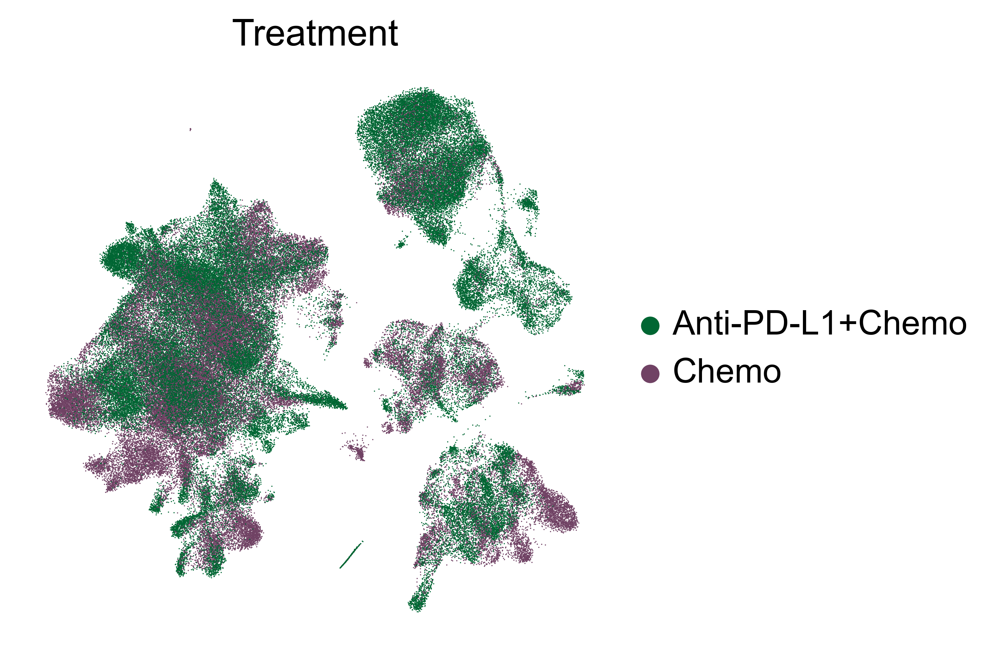

In [15]:
sc.pl.umap(
    adata,
    color="Treatment",
    show = False,
    palette={
        "Anti-PD-L1+Chemo": "#006633",
        "Chemo": "#704264",
    },
)
plt.savefig("figures/zhang_umap_treatment.png", bbox_inches="tight")

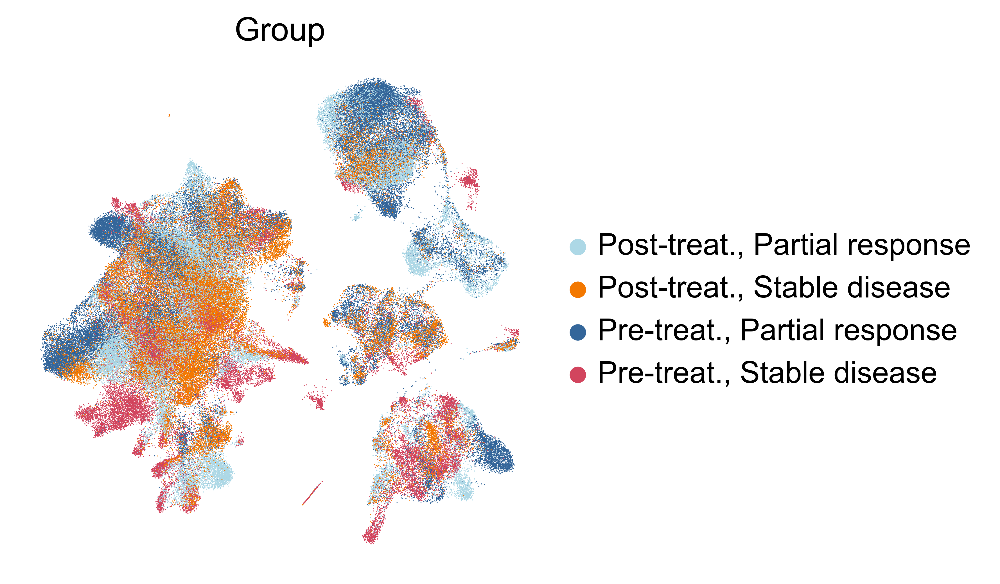

In [16]:
sc.pl.umap(
    adata,
    color="Group",
    show = False,
    palette = {
        "Pre-treat., Stable disease":  common_config.pt_red,
        "Pre-treat., Partial response": common_config.pt_blue,
        "Post-treat., Stable disease": common_config.pt_orange,
        "Post-treat., Partial response": "lightblue",
    }
)
plt.savefig("figures/zhang_umap_group.png", bbox_inches="tight")

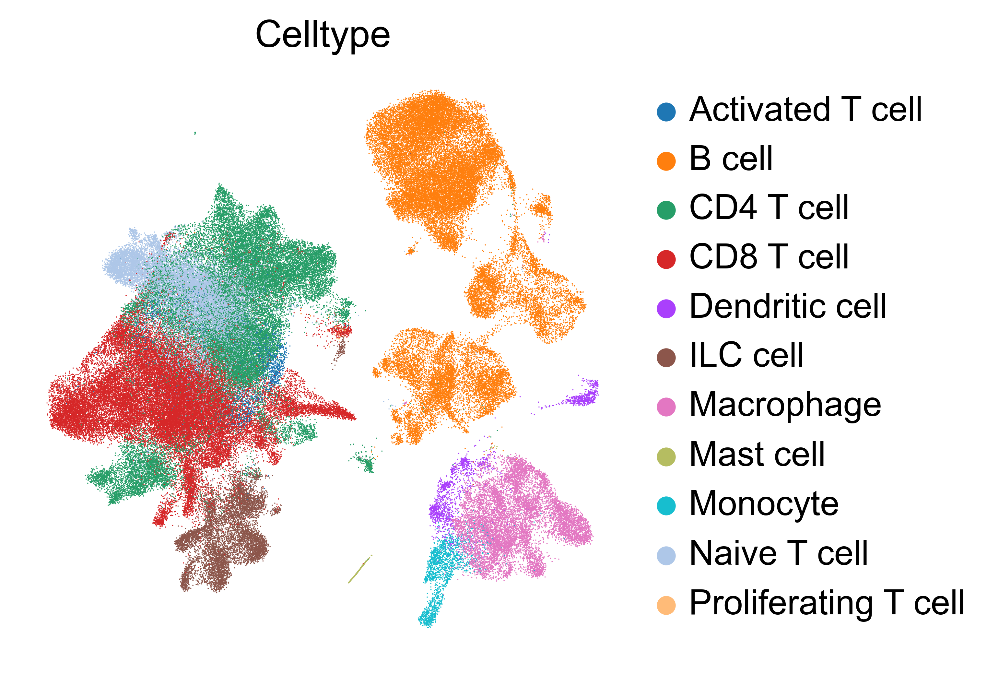

In [17]:
cell_type_converter = {
    "t_Bfoc": "B cell",
    "t_Bmem": "B cell",
    "t_Bn": "B cell",
    "t_CD4": "CD4 T cell",
    "t_CD8": "CD8 T cell",
    "t_ILC": "ILC cell",
    "t_Tact": "Activated T cell",
    "t_Tn": "Naive T cell",
    "t_Tprf": "Proliferating T cell",
    "t_cDC": "Dendritic cell",
    "t_mDC": "Dendritic cell",
    "t_macro": "Macrophage",
    "t_mast": "Mast cell",
    "t_mono": "Monocyte",
    "t_pB": "B cell",
    "t_pDC": "Dendritic cell",
}

cell_types = []
for ct in adata.obs["Cluster"]:
    for key, value in cell_type_converter.items():
        if ct.startswith(key):
            cell_types.append(value)
            break
    else:
        cell_types.append("n.a.")
adata.obs["Celltype"] = cell_types

sc.pl.umap(
    adata,
    color="Celltype",
    show = False,
)
plt.savefig("figures/zhang_umap_celltype.png", bbox_inches="tight")

In [18]:
adata.write_h5ad("data/zhang_preprocessed.h5ad")